# Project-I

## Project Title: Understanding Near-Earth Objects: Statistical Analysis and Visualization

###### 1. Introduction
Near-Earth Objects (NEOs) are celestial bodies, including asteroids and comets, whose orbits bring them close to Earth's orbit. They are of significant interest to astronomers, planetary scientists, and space agencies due to their potential impact on Earth and their scientific value in understanding the solar system's dynamics.

###### 2. Objectives
The primary objectives of this project are:

->To analyze a dataset of asteroids obtained from NASA's Jet Propulsion Laboratory (JPL).

->To identify and classify Near-Earth Objects (NEOs) within the dataset.

->To perform statistical analysis and visualization of NEO properties such as size, albedo, and orbital parameters.

->To gain insights into the distribution, characteristics, and potential hazard levels of NEOs.

###### 3. Data Collection
The dataset used in this project is sourced from NASA JPL and contains information about asteroids, including their identification, physical characteristics, orbital parameters, and potential hazard flags (NEO and PHA flags).

###### 4. Methodology
->Data Preprocessing: The dataset is loaded into a pandas DataFrame for data manipulation and analysis. Missing values are handled appropriately.

->NEO Identification: Asteroids classified as near-Earth objects (NEOs) are identified based on the 'NEO' flag in the dataset.

->Statistical Analysis: Basic statistics such as total count of NEOs, average size (diameter), average albedo, and distribution of NEO properties are calculated.

->Visualization: The distribution of NEO sizes is visualized using a histogram to understand the range and frequency of NEO sizes.

->Advanced Analysis (Optional): Correlation analysis between NEO properties, time-based analysis to identify trends, and hazard assessment based on orbital parameters are conducted if needed.

###### 5. Results and Discussion
The analysis reveals insights into the near-Earth object population, including:

The total number of NEOs identified in the dataset.
Average size (diameter) and albedo of NEOs, providing information about their physical characteristics.
Distribution patterns of NEO sizes, highlighting the diversity in the population.
Correlations between NEO properties, trends over time, and potential hazard levels.

###### 6. Conclusion
This project enhances our understanding of Near-Earth Objects (NEOs) by utilizing real-world data from NASA JPL. The analysis and visualization techniques employed provide valuable insights into NEO characteristics, aiding in planetary science research and informing strategies for planetary defense against potential impact events.

#### Details of Dataset

### Basic Column Definition
SPK-ID: Object primary SPK-ID

Object ID: Object internal database ID

Object fullname: Object full name/designation

pdes: Object primary designation

name: Object IAU name

NEO: Near-Earth Object (NEO) flag

PHA: Potentially Hazardous Asteroid (PHA) flag

H: Absolute magnitude parameter

Diameter: object diameter (from equivalent sphere) km Unit

Albedo: Geometric albedo

Diameter_sigma: 1-sigma uncertainty in object diameter km Unit

Orbit_id: Orbit solution ID

Epoch: Epoch of osculation in modified Julian day form

Equinox: Equinox of reference frame

e: Eccentricity

a: Semi-major axis au Unit

q: perihelion distance au Unit

i: inclination; angle with respect to x-y ecliptic plane

tp: Time of perihelion passage TDB Unit

moid_ld: Earth Minimum Orbit Intersection Distance au Unit

In [1]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
#plt.style.use('fivethirtyeight')
#plt.style.use('dark_background')
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
# Loading asteroid dataset into a pandas DataFrame
asteroids_df = pd.read_csv('G:/Astronomy Data Sets/!Asteroid Dataset/dataset.csv')

In [3]:
asteroids_df

,id,spkid,full_name,pdes,name,prefix,neo,pha,H,diameter,...,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,class,rms
0,a0000001,2000001,1 Ceres,1,Ceres,NaN,N,N,3.400,939.400,...,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,MBA,0.43301
1,a0000002,2000002,2 Pallas,2,Pallas,NaN,N,N,4.200,545.000,...,3.469400e-06,6.272400e-06,9.128200e-06,8.859100e-06,4.961300e-09,4.653600e-10,4.078700e-05,3.680700e-06,MBA,0.35936
2,a0000003,2000003,3 Juno,3,Juno,NaN,N,N,5.330,246.596,...,3.223100e-06,1.664600e-05,1.772100e-05,8.110400e-06,4.363900e-09,4.413400e-10,3.528800e-05,3.107200e-06,MBA,0.33848
3,a0000004,2000004,4 Vesta,4,Vesta,NaN,N,N,3.000,525.400,...,2.170600e-07,3.880800e-07,1.789300e-07,1.206800e-06,1.648600e-09,2.612500e-10,4.103700e-06,1.274900e-06,MBA,0.39980
4,a0000005,2000005,5 Astraea,5,Astraea,NaN,N,N,6.900,106.699,...,2.740800e-06,2.894900e-05,2.984200e-05,8.303800e-06,4.729000e-09,5.522700e-10,3.474300e-05,3.490500e-06,MBA,0.52191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
958519,bPLS6013,3246801,(6013 P-L),6013 P-L,NaN,NaN,N,N,17.135,NaN,...,6.969000e+00,7.433000e+00,4.631100e+01,2.738300e+01,1.041200e+00,1.652100e-01,1.309700e+02,7.264900e+02,MBA,0.23839
958520,bPLS6331,3246834,(6331 P-L),6331 P-L,NaN,NaN,N,N,18.500,NaN,...,1.563500e-05,5.598600e-05,2.380400e-04,1.298200e-04,2.418900e-08,3.346100e-09,4.690200e-04,1.578500e-05,MBA,0.53633
958521,bPLS6344,3013075,(6344 P-L),6344 P-L,NaN,NaN,Y,Y,20.400,NaN,...,1.853300e-05,5.691700e-05,8.969200e-05,5.272600e-05,1.650100e-07,1.101600e-08,2.830600e-04,9.127500e-05,APO,0.51556
958522,bT2S2060,3246457,(2060 T-2),2060 T-2,NaN,NaN,N,N,18.071,NaN,...,5.448800e-01,4.391600e+00,1.898800e+01,1.083800e+01,7.171600e-01,1.016700e-01,3.898400e+01,5.035500e+02,MBA,0.25641


In [4]:
df = asteroids_df

In [5]:
df.head()

,id,spkid,full_name,pdes,name,prefix,neo,pha,H,diameter,...,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,class,rms
0,a0000001,2000001,1 Ceres,1,Ceres,NaN,N,N,3.40,939.400,...,4.608900e-09,6.168800e-08,6.624800e-08,7.820700e-09,1.111300e-11,1.196500e-12,3.782900e-08,9.415900e-09,MBA,0.43301
1,a0000002,2000002,2 Pallas,2,Pallas,NaN,N,N,4.20,545.000,...,3.469400e-06,6.272400e-06,9.128200e-06,8.859100e-06,4.961300e-09,4.653600e-10,4.078700e-05,3.680700e-06,MBA,0.35936
2,a0000003,2000003,3 Juno,3,Juno,NaN,N,N,5.33,246.596,...,3.223100e-06,1.664600e-05,1.772100e-05,8.110400e-06,4.363900e-09,4.413400e-10,3.528800e-05,3.107200e-06,MBA,0.33848
3,a0000004,2000004,4 Vesta,4,Vesta,NaN,N,N,3.00,525.400,...,2.170600e-07,3.880800e-07,1.789300e-07,1.206800e-06,1.648600e-09,2.612500e-10,4.103700e-06,1.274900e-06,MBA,0.39980
4,a0000005,2000005,5 Astraea,5,Astraea,NaN,N,N,6.90,106.699,...,2.740800e-06,2.894900e-05,2.984200e-05,8.303800e-06,4.729000e-09,5.522700e-10,3.474300e-05,3.490500e-06,MBA,0.52191


In [6]:
df.tail()

,id,spkid,full_name,pdes,name,prefix,neo,pha,H,diameter,...,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,class,rms
958519,bPLS6013,3246801,(6013 P-L),6013 P-L,NaN,NaN,N,N,17.135,NaN,...,6.969000,7.433000,46.311000,27.383000,1.041200e+00,1.652100e-01,130.970000,726.490000,MBA,0.23839
958520,bPLS6331,3246834,(6331 P-L),6331 P-L,NaN,NaN,N,N,18.500,NaN,...,0.000016,0.000056,0.000238,0.000130,2.418900e-08,3.346100e-09,0.000469,0.000016,MBA,0.53633
958521,bPLS6344,3013075,(6344 P-L),6344 P-L,NaN,NaN,Y,Y,20.400,NaN,...,0.000019,0.000057,0.000090,0.000053,1.650100e-07,1.101600e-08,0.000283,0.000091,APO,0.51556
958522,bT2S2060,3246457,(2060 T-2),2060 T-2,NaN,NaN,N,N,18.071,NaN,...,0.544880,4.391600,18.988000,10.838000,7.171600e-01,1.016700e-01,38.984000,503.550000,MBA,0.25641
958523,bT3S2678,3246553,(2678 T-3),2678 T-3,NaN,NaN,N,N,18.060,NaN,...,1.102300,0.311700,1.284300,0.473610,1.626700e-01,2.487900e-02,5.523600,106.480000,MBA,0.26980


## Analysis

## 1.0. Distribution of Near-Earth Object (NEO) sizes

Average Diameter of NEOs: 1.1689982332155475 km
Average Albedo of NEOs: 0.18009750623441395


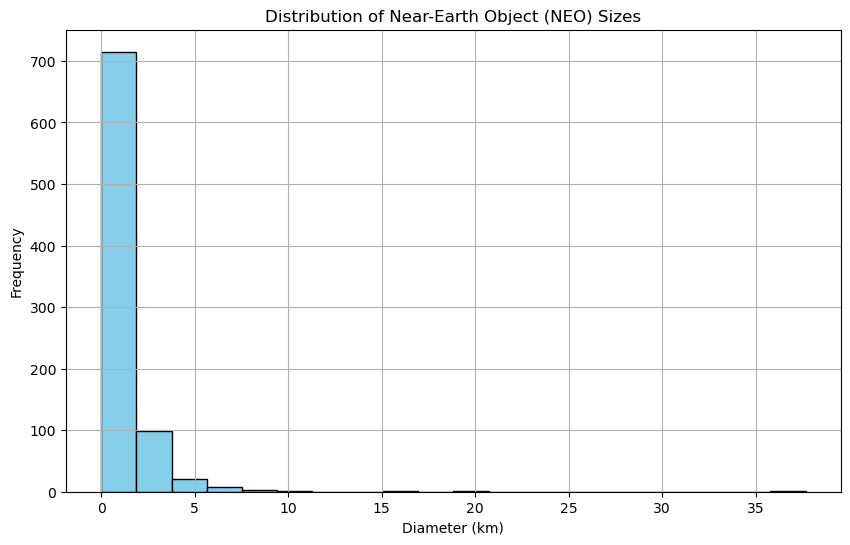

<Figure size 640x480 with 0 Axes>

In [7]:
# Filter asteroids that are classified as near-Earth objects (NEOs)
neo_df = asteroids_df[asteroids_df['neo'] == 'Y']

# Calculate the average diameter and albedo of NEOs
average_diameter = neo_df['diameter'].mean()
average_albedo = neo_df['albedo'].mean()

# Print the average values
print(f"Average Diameter of NEOs: {average_diameter} km")
print(f"Average Albedo of NEOs: {average_albedo}")

# Visualize the distribution of NEO sizes
plt.figure(figsize=(10, 6))
plt.hist(neo_df['diameter'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Diameter (km)')
plt.ylabel('Frequency')
plt.title('Distribution of Near-Earth Object (NEO) Sizes')
plt.grid(True)
plt.show()
plt.savefig('1. Distribution of Near-Earth Object_NEO.png')

## 1.2. Relation between Diameter and Albedo
## 1.2. Correlation Matrix: 'Diameter', 'Albedo', 'e', 'a', 'q', 'i'

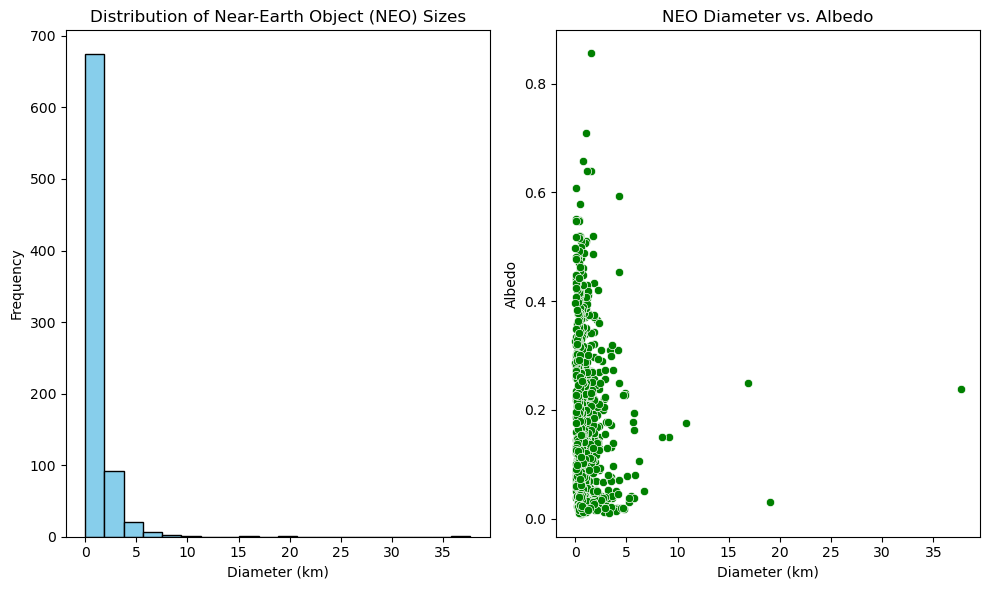

Total NEOs: 799
Average Diameter of NEOs: 1.1688785982478098 km
Average Albedo of NEOs: 0.17997897371714644

Correlation Matrix:
          diameter    albedo         e         a         q         i
diameter  1.000000 -0.095490  0.107456  0.232905  0.148207  0.127162
albedo   -0.095490  1.000000 -0.135313 -0.225138 -0.059036 -0.046786
e         0.107456 -0.135313  1.000000  0.562927 -0.435701 -0.037020
a         0.232905 -0.225138  0.562927  1.000000  0.441007  0.006849
q         0.148207 -0.059036 -0.435701  0.441007  1.000000  0.046737
i         0.127162 -0.046786 -0.037020  0.006849  0.046737  1.000000


In [8]:
# Data Preprocessing
# Assuming the dataset columns match the provided list
neo_df = df[df['neo'] == 'Y']  # Filter NEOs
neo_df = neo_df.dropna(subset=['diameter', 'albedo'])  # Drop rows with missing values in diameter and albedo columns

# Statistical Analysis
total_neos = len(neo_df)
average_diameter = neo_df['diameter'].mean()
average_albedo = neo_df['albedo'].mean()

# Visualization
plt.figure(figsize=(10, 6))

# Histogram of NEO diameters
plt.subplot(1, 2, 1)
plt.hist(neo_df['diameter'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Diameter (km)')
plt.ylabel('Frequency')
plt.title('Distribution of Near-Earth Object (NEO) Sizes')

# Scatter plot of NEO diameters vs. albedo
plt.subplot(1, 2, 2)
sns.scatterplot(data=neo_df, x='diameter', y='albedo', color='green')
plt.xlabel('Diameter (km)')
plt.ylabel('Albedo')
plt.title('NEO Diameter vs. Albedo')

plt.tight_layout()
plt.show()
#plt.savefig('2.Distribution of NEO Sizes and NEO Diameter vs Albedo.png')

# Additional Analysis (Optional)
# Correlation analysis
correlation_matrix = neo_df[['diameter', 'albedo', 'e', 'a', 'q', 'i']].corr()

# Print results
print(f"Total NEOs: {total_neos}")
print(f"Average Diameter of NEOs: {average_diameter} km")
print(f"Average Albedo of NEOs: {average_albedo}")
print("\nCorrelation Matrix:")
print(correlation_matrix)

## Research Terminologies

### 2.1: Orbital Dynamics Analysis

Calculate and analyze orbital parameters such as eccentricity ('e'), semi-major axis ('a'), perihelion distance ('q'), inclination ('i'), and others.

Visualize the distribution of these orbital parameters for NEOs.

Identify any patterns or correlations between orbital parameters and other characteristics like size or albedo.

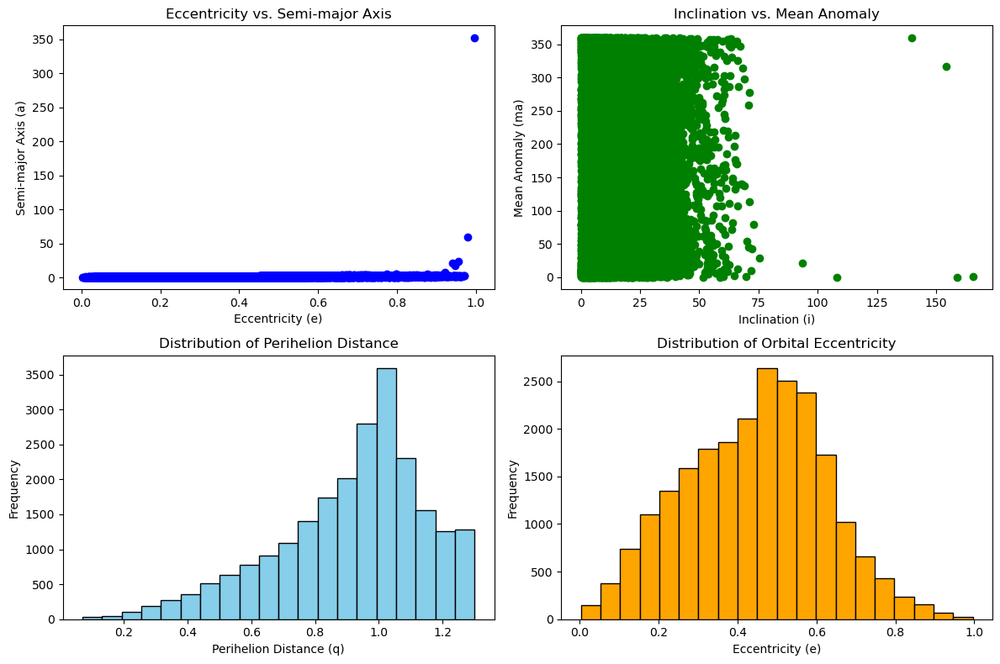

In [10]:
# Filter asteroids that are classified as near-Earth objects (NEOs)
neo_df = df[df['neo'] == 'Y']

# Extract relevant columns for orbital dynamics analysis
orbital_df = neo_df[['diameter', 'e', 'a', 'q', 'i', 'om', 'w', 'ma']]

# Calculate additional orbital parameters if needed
# For example, calculating semi-major axis (a) from perihelion distance (q) and eccentricity (e)
orbital_df['calculated_a'] = orbital_df['q'] / (1 - orbital_df['e'])

# Visualize the distribution of orbital parameters
plt.figure(figsize=(12, 8))

# Scatter plot of eccentricity vs. semi-major axis
plt.subplot(2, 2, 1)
plt.scatter(orbital_df['e'], orbital_df['a'], color='blue')
plt.xlabel('Eccentricity (e)')
plt.ylabel('Semi-major Axis (a)')
plt.title('Eccentricity vs. Semi-major Axis')

# Scatter plot of inclination vs. orbital period
plt.subplot(2, 2, 2)
plt.scatter(orbital_df['i'], orbital_df['ma'], color='green')
plt.xlabel('Inclination (i)')
plt.ylabel('Mean Anomaly (ma)')
plt.title('Inclination vs. Mean Anomaly')

# Histogram of perihelion distance
plt.subplot(2, 2, 3)
plt.hist(orbital_df['q'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Perihelion Distance (q)')
plt.ylabel('Frequency')
plt.title('Distribution of Perihelion Distance')

# Histogram of orbital eccentricity
plt.subplot(2, 2, 4)
plt.hist(orbital_df['e'], bins=20, color='orange', edgecolor='black')
plt.xlabel('Eccentricity (e)')
plt.ylabel('Frequency')
plt.title('Distribution of Orbital Eccentricity')

plt.tight_layout()
plt.show()
#plt.savefig('3.Orbital Dynamic Analysis.png')

### 2.2 Hazard Assessment

Utilize the Earth Minimum Orbit Intersection Distance ('moid_ld') to assess the potential hazard level of NEOs.

Classify NEOs based on their hazard levels and visualize the distribution of hazard classifications.

Explore strategies for impact mitigation and planetary defense based on hazard assessments.

Low Hazard NEOs: 1
Medium Hazard NEOs: 0
High Hazard NEOs: 22894


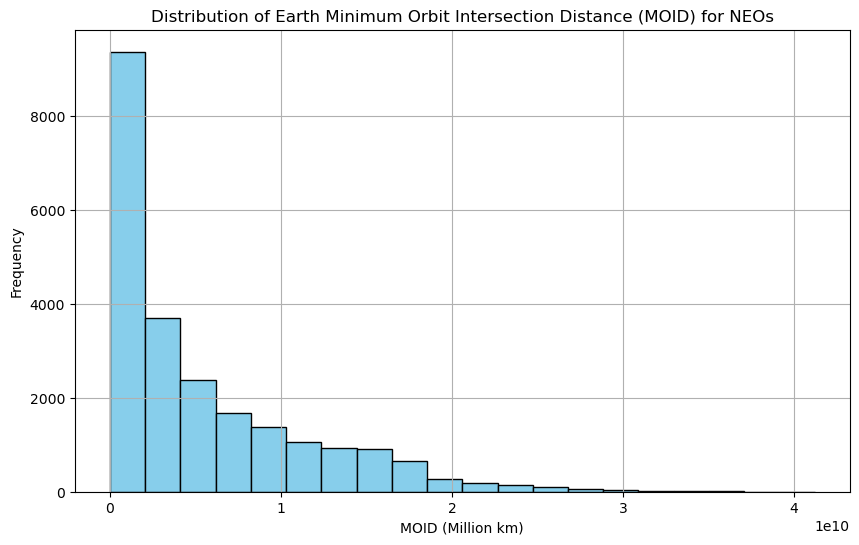

<Figure size 640x480 with 0 Axes>

In [11]:
# Filter asteroids that are classified as near-Earth objects (NEOs)
neo_df = df[df['neo'] == 'Y']

# Calculate the Earth Minimum Orbit Intersection Distance (MOID)
neo_df['moid_ld'] = neo_df['moid_ld'].astype(float)  # Convert MOID to float if needed
neo_df['MOID_km'] = neo_df['moid_ld'] * 149597870.7  # Convert MOID from AU to kilometers

# Classify NEOs based on MOID into low, medium, and high hazard levels
low_hazard_neos = neo_df[neo_df['MOID_km'] < 0.05]  # MOID less than 0.05 million km (50,000 km)
medium_hazard_neos = neo_df[(neo_df['MOID_km'] >= 0.05) & (neo_df['MOID_km'] < 1)]  # MOID between 0.05 and 1 million km
high_hazard_neos = neo_df[neo_df['MOID_km'] >= 1]  # MOID greater than or equal to 1 million km

# Print the count of NEOs in each hazard level
print(f"Low Hazard NEOs: {len(low_hazard_neos)}")
print(f"Medium Hazard NEOs: {len(medium_hazard_neos)}")
print(f"High Hazard NEOs: {len(high_hazard_neos)}")

# Visualize the distribution of MOID for NEOs
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(neo_df['MOID_km'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('MOID (Million km)')
plt.ylabel('Frequency')
plt.title('Distribution of Earth Minimum Orbit Intersection Distance (MOID) for NEOs')
plt.grid(True)
plt.show()
plt.savefig('4.Hazard Assessment.png')

### 2.3 Time-Based Analysis

Analyze temporal trends in NEO properties over time if your dataset includes timestamps or historical data.

Identify any changes or fluctuations in NEO characteristics, orbital parameters, or hazard levels over different epochs.

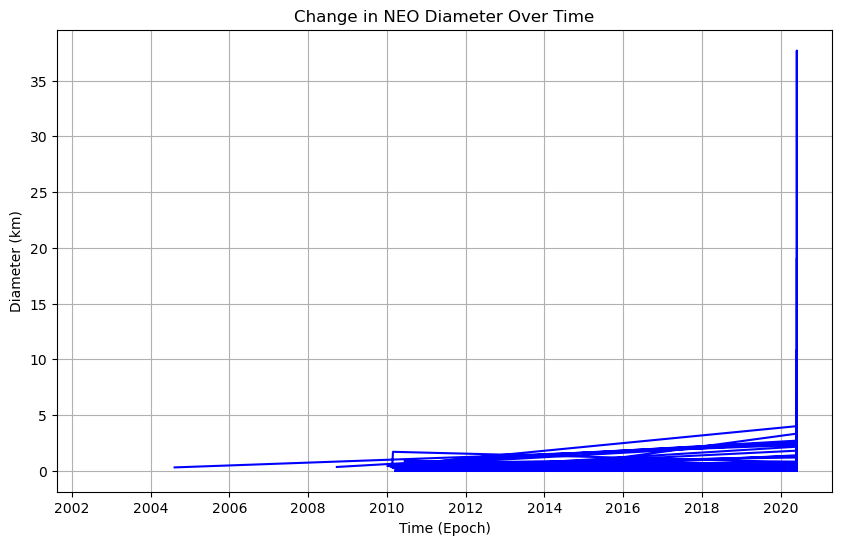

In [12]:
# Filter asteroids that are classified as near-Earth objects (NEOs)
neo_df = df[df['neo'] == 'Y']

# Assuming your dataset includes a column for 'Epoch' in modified Julian day form
# Convert 'Epoch' to datetime format for time-based analysis
neo_df['epoch'] = pd.to_datetime(neo_df['epoch'], unit='D', origin='julian')

# Time-based analysis example: Analyze changes in NEO diameters over time
# Assuming 'diameter' is a relevant parameter in your dataset
plt.figure(figsize=(10, 6))
plt.plot(neo_df['epoch'], neo_df['diameter'], color='blue')
plt.xlabel('Time (Epoch)')
plt.ylabel('Diameter (km)')
plt.title('Change in NEO Diameter Over Time')
plt.grid(True)
plt.show()

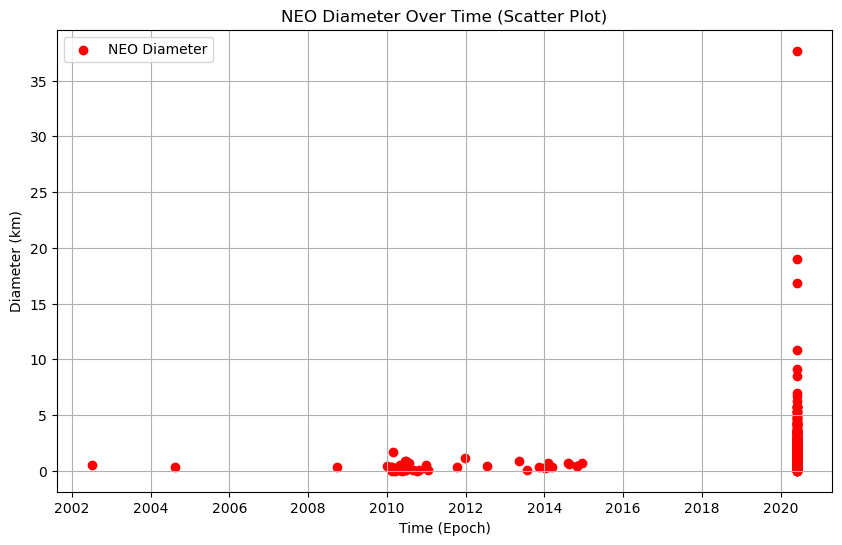

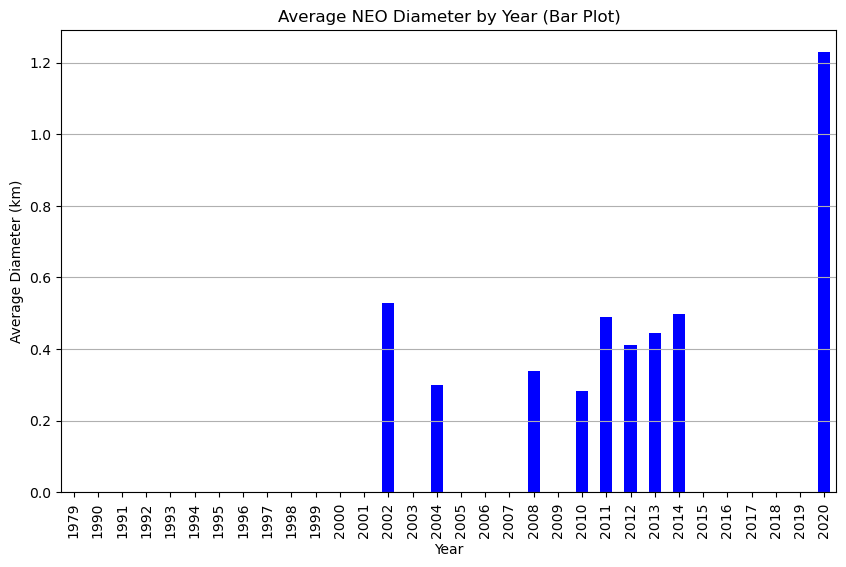

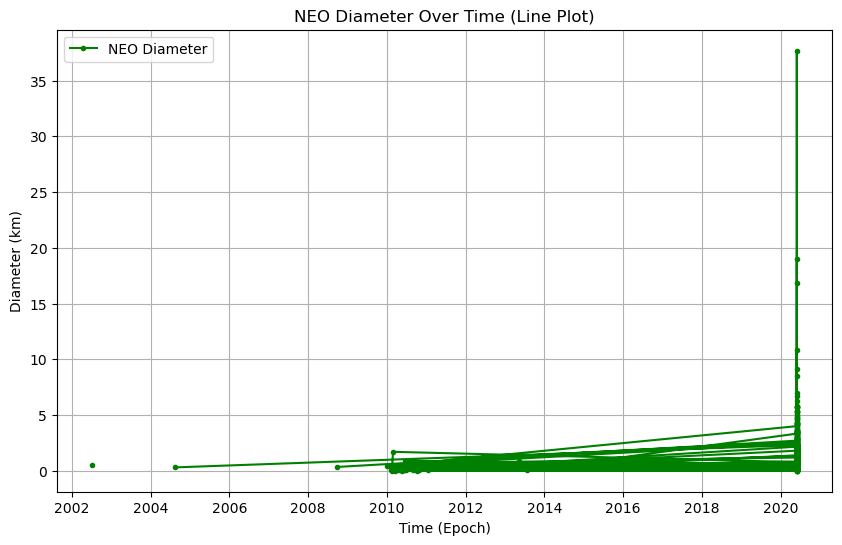

In [13]:
# Filter asteroids that are classified as near-Earth objects (NEOs)
neo_df = df[df['neo'] == 'Y']

# Assuming your dataset includes a column for 'Epoch' in modified Julian day form
# Convert 'Epoch' to datetime format for time-based analysis
neo_df['epoch'] = pd.to_datetime(neo_df['epoch'], unit='D', origin='julian')

# Time-based analysis example: Analyze changes in NEO diameters over time
# Assuming 'diameter' is a relevant parameter in your dataset

# Scatter plot showing NEO diameters over time
plt.figure(figsize=(10, 6))
plt.scatter(neo_df['epoch'], neo_df['diameter'], color='red', marker='o', label='NEO Diameter')
plt.xlabel('Time (Epoch)')
plt.ylabel('Diameter (km)')
plt.title('NEO Diameter Over Time (Scatter Plot)')
plt.legend()
plt.grid(True)
plt.show()

# Bar plot showing average diameter of NEOs in each year
neo_df['Year'] = neo_df['epoch'].dt.year  # Extract year from Epoch
average_diameter_by_year = neo_df.groupby('Year')['diameter'].mean()

plt.figure(figsize=(10, 6))
average_diameter_by_year.plot(kind='bar', color='blue')
plt.xlabel('Year')
plt.ylabel('Average Diameter (km)')
plt.title('Average NEO Diameter by Year (Bar Plot)')
plt.grid(axis='y')
plt.show()

# Line plot showing changes in NEO diameters over time
plt.figure(figsize=(10, 6))
plt.plot(neo_df['epoch'], neo_df['diameter'], color='green', linestyle='-', marker='.', label='NEO Diameter')
plt.xlabel('Time (Epoch)')
plt.ylabel('Diameter (km)')
plt.title('NEO Diameter Over Time (Line Plot)')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig('5.Time-Based Analysis.png')

### 2.4. Impact Simulation Visualization:

Use simulations or models to visualize potential NEO impact scenarios with Earth.

Illustrate the effects of different NEO sizes, velocities, and impact angles on potential impact outcomes.

Discuss the implications of such simulations for impact risk assessment and mitigation strategies.

--> Model

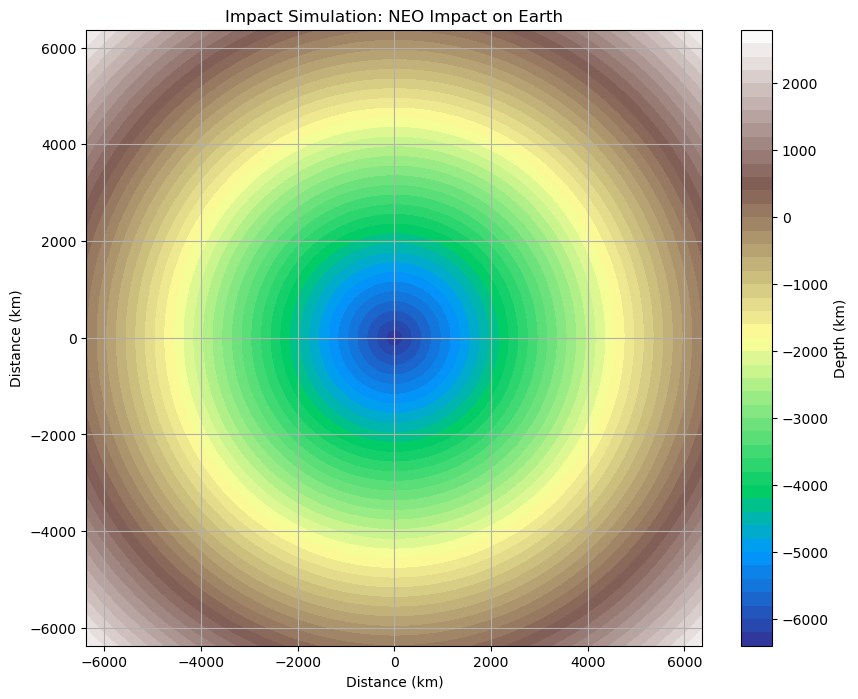

In [14]:
# Define constants for the simulation
earth_radius_km = 6371  # Earth's radius in kilometers
neo_diameter_km = 1     # NEO's diameter in kilometers (for illustration purposes)
impact_velocity_kmps = 20  # Impact velocity in kilometers per second
impact_angle_deg = 45       # Impact angle in degrees

# Calculate impact energy using the kinetic energy formula
impact_energy_joules = 0.5 * (neo_diameter_km ** 3) * (impact_velocity_kmps ** 2)

# Calculate impact area and resulting impact depth (simplified)
impact_area_km2 = np.pi * (neo_diameter_km / 2) ** 2
impact_depth_km = impact_energy_joules / (impact_area_km2 * 2.5e6)  # Assume energy-to-depth conversion factor

# Generate a 2D grid representing Earth's surface
x = np.linspace(-earth_radius_km, earth_radius_km, 1000)
y = np.linspace(-earth_radius_km, earth_radius_km, 1000)
X, Y = np.meshgrid(x, y)
Z = np.sqrt(X ** 2 + Y ** 2) - earth_radius_km  # Earth's surface (Z = 0 at Earth's surface)

# Simulate the impact crater
impact_radius_km = np.sqrt(impact_area_km2 / np.pi)  # Impact radius based on area
impact_mask = (X ** 2 + Y ** 2) <= (impact_radius_km ** 2)
Z[impact_mask] -= impact_depth_km  # Adjust the surface to simulate the impact crater

# Plot the impact simulation
plt.figure(figsize=(10, 8))
plt.contourf(X, Y, Z, levels=50, cmap='terrain')
plt.colorbar(label='Depth (km)')
plt.xlabel('Distance (km)')
plt.ylabel('Distance (km)')
plt.title('Impact Simulation: NEO Impact on Earth')
plt.gca().set_aspect('equal', adjustable='box')
plt.grid(True)
plt.show()
#plt.savefig('Impact Simulation Visualization.png')

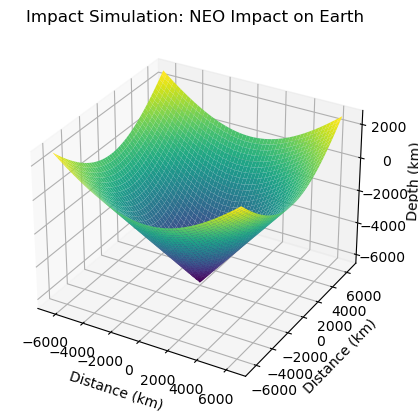

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Sample data for demonstration (replace with your actual dataset)
neo_data = {
    'diameter': 1,  # Diameter in kilometers
    'H': 22,  # Absolute magnitude
    'epoch': '2024-05-11',  # Epoch of observation
    'a': 1.2,  # Semi-major axis in AU
    'e': 0.3,  # Orbital eccentricity
    'i': 10,  # Orbital inclination in degrees
    'om': 45,  # Longitude of the ascending node
    'w': 90,  # Argument of perihelion
    'ma': 180,  # Mean anomaly
    'moid_ld': 10,  # Earth Minimum Orbit Intersection Distance in lunar distances
    'neo': 'Y'  # Flag indicating if NEO
}

# Define constants for the simulation
earth_radius_km = 6371  # Earth's radius in kilometers
impact_velocity_kmps = 20  # Impact velocity in kilometers per second
impact_angle_deg = 45  # Impact angle in degrees

# Calculate impact energy using the kinetic energy formula
impact_energy_joules = 0.5 * (neo_data['diameter'] ** 3) * (impact_velocity_kmps ** 2)

# Calculate impact area and resulting impact depth (simplified)
impact_area_km2 = np.pi * (neo_data['diameter'] / 2) ** 2
impact_depth_km = impact_energy_joules / (impact_area_km2 * 2.5e6)  # Assume energy-to-depth conversion factor

# Generate a 2D grid representing Earth's surface
x = np.linspace(-earth_radius_km, earth_radius_km, 1000)
y = np.linspace(-earth_radius_km, earth_radius_km, 1000)
X, Y = np.meshgrid(x, y)
Z = np.sqrt(X ** 2 + Y ** 2) - earth_radius_km  # Earth's surface (Z = 0 at Earth's surface)

# Simulate the impact crater
impact_radius_km = np.sqrt(impact_area_km2 / np.pi)  # Impact radius based on area
impact_mask = (X ** 2 + Y ** 2) <= (impact_radius_km ** 2)
Z[impact_mask] -= impact_depth_km  # Adjust the surface to simulate the impact crater

# Create a 3D surface plot for the impact simulation using Matplotlib
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis')

ax.set_xlabel('Distance (km)')
ax.set_ylabel('Distance (km)')
ax.set_zlabel('Depth (km)')
ax.set_title('Impact Simulation: NEO Impact on Earth')

plt.show()

In [16]:
data = asteroids_df

#### 2.5.1. Orbital Classification Analysis:
Classify NEOs into different orbital classes such as Apollo, Amor, and Aten based on their orbital parameters (e, a, q, i).
Analyze the distribution of NEOs across different orbital classes and assess their relative proximity and potential impact risks.

In [17]:
# Define orbital class criteria based on eccentricity (e) and semi-major axis (a)
def classify_orbital_class(row):
    if row['e'] < 1 and row['a'] > 1.0:
        return 'Apollo'
    elif row['e'] < 1 and row['a'] < 1.0:
        return 'Amor'
    elif row['e'] > 1:
        return 'Aten'
    else:
        return 'Other'

# Apply orbital classification function to each row and create a new column 'Orbital_Class'
df['Orbital_Class'] = df.apply(classify_orbital_class, axis=1)

# Analyze the distribution of NEOs across different orbital classes
orbital_class_distribution = df['Orbital_Class'].value_counts()

# Calculate the relative proximity and potential impact risks based on orbital parameters
# You can further analyze specific orbital classes for impact risks using additional criteria

# Print the distribution of NEOs across orbital classes
print("Distribution of NEOs Across Orbital Classes:")
print(orbital_class_distribution)

Distribution of NEOs Across Orbital Classes:
Apollo    956769
Amor        1751
Aten           4
Name: Orbital_Class, dtype: int64


#### 2.5.2 Temporal Distribution Analysis:
Investigate the temporal distribution of NEOs by analyzing their epoch of observation (Epoch) and plotting the number of NEO discoveries over time.
Identify any temporal trends, periodicities, or variations in NEO discoveries, potentially related to observational efforts or orbital dynamics

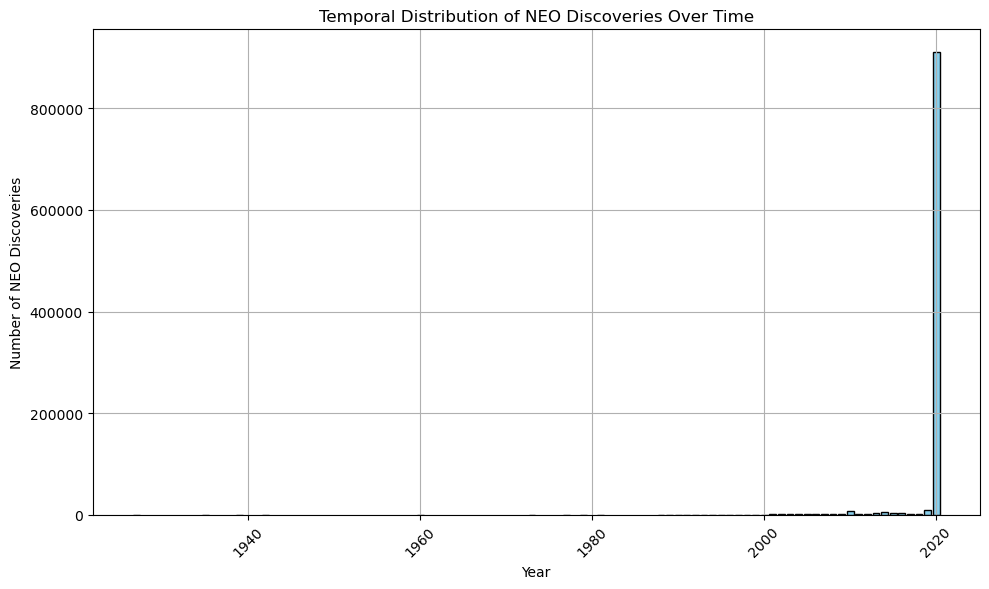

In [19]:
import matplotlib.pyplot as plt

# Group by year and count the number of NEO discoveries per year
neo_discoveries_per_year = df.groupby(df['Year']).size().reset_index(name='Number of NEO Discoveries')

# Plot the temporal distribution of NEO discoveries using matplotlib
plt.figure(figsize=(10, 6))
plt.bar(neo_discoveries_per_year['Year'], neo_discoveries_per_year['Number of NEO Discoveries'],
        color='skyblue', edgecolor='black')
plt.xlabel('Year')
plt.ylabel('Number of NEO Discoveries')
plt.title('Temporal Distribution of NEO Discoveries Over Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### 2.5.3 Size and Albedo Correlation:
Explore the correlation between NEOs' size (diameter) and albedo (geometric reflectivity) to understand how these properties influence their classification as potentially hazardous asteroids (PHAs) or non-PHAs.
Visualize the relationship between size and albedo using scatter plots or regression analysis to identify patterns or clusters among NEOs.

In [32]:
# Filter out rows with missing values in 'Diameter' and 'Albedo' columns
df = df.dropna(subset=['diameter', 'albedo'])

# Scatter plot to visualize the correlation between size (Diameter) and albedo (Albedo)
fig = px.scatter(df, x='diameter', y='albedo', color='pha',
                 title='Correlation Between NEO Size and Albedo',
                 labels={'diameter': 'Diameter (km)', 'albedo': 'Albedo', 'pha': 'PHA Classification'},
                 template='plotly_dark')
fig.update_traces(marker=dict(size=8))  # Adjust marker size for better visibility
fig.update_layout(showlegend=True)
fig.show()

#### 2.5.4 Eccentricity-Inclination Analysis:
Analyze the distribution of NEOs based on their eccentricity (e) and inclination (i) values to identify clusters or groups with specific orbital characteristics.
Investigate how eccentricity and inclination influence NEOs' orbital stability, potential impact trajectories, and classification as PHAs.

In [33]:
import plotly.express as px

# Scatter plot to visualize the distribution of NEOs based on eccentricity (e) and inclination (i) using Plotly
fig = px.scatter(df, x='e', y='i', color='pha', title='Eccentricity-Inclination Analysis of NEOs',
                 labels={'e': 'Eccentricity', 'i': 'Inclination', 'pha': 'PHA Classification'},
                 template='plotly_dark')
fig.update_traces(marker=dict(size=8, line=dict(width=0.5, color='white')))  # Adjust marker size and edge color
fig.update_layout(coloraxis_colorbar=dict(title='PHA Classification'))
fig.show()

#### 2.5.5 Impact Risk Assessment by Size:
Calculate the impact risk probabilities for NEOs based on their size (diameter) and Earth Minimum Orbit Intersection Distance (moid_ld).
Classify NEOs into different size categories (small, medium, large) and assess the corresponding impact risk levels using impact risk scales or probabilistic models.

In [24]:
# Define size categories based on diameter (you can adjust thresholds as needed)
def classify_size_category(diameter):
    if diameter <= 50:
        return 'Small'
    elif 50 < diameter <= 200:
        return 'Medium'
    else:
        return 'Large'

# Apply size classification function to each row and create a new column 'Size_Category'
df['Size_Category'] = df['diameter'].apply(classify_size_category)

# Calculate impact risk probabilities based on size (diameter) and Earth Minimum Orbit Intersection Distance (moid_ld)
# Example calculation (you can modify this based on your specific impact risk model)
df['Impact_Risk_Probability'] = df['diameter'] / df['moid_ld']

# Define impact risk levels based on calculated probabilities
def classify_risk_level(probability):
    if probability <= 0.5:
        return 'Low'
    elif 0.5 < probability <= 1.0:
        return 'Moderate'
    else:
        return 'High'

# Apply risk level classification function to each row and create a new column 'Risk_Level'
df['Risk_Level'] = df['Impact_Risk_Probability'].apply(classify_risk_level)

# Display the NEOs categorized by size and their corresponding impact risk levels
print("NEOs Categorized by Size and Impact Risk Levels:")
print(df[['name', 'diameter', 'Size_Category', 'Impact_Risk_Probability', 'Risk_Level']])

NEOs Categorized by Size and Impact Risk Levels:
           name  diameter Size_Category  Impact_Risk_Probability Risk_Level
0         Ceres   939.400         Large                 1.513598       High
1        Pallas   545.000         Large                 1.134593       High
2          Juno   246.596         Large                 0.612639   Moderate
3         Vesta   525.400         Large                 1.184797       High
4       Astraea   106.699        Medium                 0.250213        Low
...         ...       ...           ...                      ...        ...
891599      NaN     3.793         Small                 0.005866        Low
891841      NaN     2.696         Small                 0.005047        Low
894103      NaN     3.271         Small                 0.007211        Low
901055      NaN     3.009         Small                 0.005076        Low
909489      NaN     1.600         Small                 0.003543        Low

[135100 rows x 5 columns]


In [25]:
# Define size categories based on diameter
def classify_size_category(diameter):
    if diameter <= 50:
        return 'Small'
    elif 50 < diameter <= 200:
        return 'Medium'
    else:
        return 'Large'

# Apply size classification function to each row and create a new column 'Size_Category'
df['Size_Category'] = df['diameter'].apply(classify_size_category)

# Calculate impact risk probabilities based on size (diameter) and Earth Minimum Orbit Intersection Distance (moid_ld)
# Example calculation (you can modify this based on your specific impact risk model)
df['Impact_Risk_Probability'] = df['diameter'] / df['moid_ld']

# Define impact risk levels based on calculated probabilities
def classify_risk_level(probability):
    if probability <= 0.5:
        return 'Low'
    elif 0.5 < probability <= 1.0:
        return 'Moderate'
    else:
        return 'High'

# Apply risk level classification function to each row and create a new column 'Risk_Level'
df['Risk_Level'] = df['Impact_Risk_Probability'].apply(classify_risk_level)

# Count the number of NEOs in each size category and risk level
size_risk_counts = df.groupby(['Size_Category', 'Risk_Level']).size().reset_index(name='Count')

# Plotting the bar chart using Plotly
fig = px.bar(size_risk_counts, x='Size_Category', y='Count', color='Risk_Level',
             title='Impact Risk Assessment by Size and Risk Level for NEOs',
             labels={'Size_Category': 'Size Category', 'Count': 'NEO Count', 'Risk_Level': 'Risk Level'},
             template='plotly_dark')
fig.update_layout(barmode='group')
fig.show()

In [26]:
from plotly.subplots import make_subplots

# Define size categories based on diameter
def classify_size_category(diameter):
    if diameter <= 50:
        return 'Small'
    elif 50 < diameter <= 200:
        return 'Medium'
    else:
        return 'Large'

# Apply size classification function to each row and create a new column 'Size_Category'
df['Size_Category'] = df['diameter'].apply(classify_size_category)

# Calculate impact risk probabilities based on size (diameter) and Earth Minimum Orbit Intersection Distance (moid_ld)
# Example calculation (you can modify this based on your specific impact risk model)
df['Impact_Risk_Probability'] = df['diameter'] / df['moid_ld']

# Define impact risk levels based on calculated probabilities
def classify_risk_level(probability):
    if probability <= 0.5:
        return 'Low'
    elif 0.5 < probability <= 1.0:
        return 'Moderate'
    else:
        return 'High'

# Apply risk level classification function to each row and create a new column 'Risk_Level'
df['Risk_Level'] = df['Impact_Risk_Probability'].apply(classify_risk_level)

# Count the number of NEOs in each size category and risk level
size_risk_counts = df.groupby(['Size_Category', 'Risk_Level']).size().reset_index(name='Count')

# Filter the data for each risk level (Low, Moderate, High)
low_risk_data = size_risk_counts[size_risk_counts['Risk_Level'] == 'Low']
moderate_risk_data = size_risk_counts[size_risk_counts['Risk_Level'] == 'Moderate']
high_risk_data = size_risk_counts[size_risk_counts['Risk_Level'] == 'High']

# Create subplots for each risk level
fig = make_subplots(rows=1, cols=3, subplot_titles=('Low Risk', 'Moderate Risk', 'High Risk'))

# Add bar charts for each risk level to the subplots
for idx, (risk_data, title) in enumerate(zip([low_risk_data, moderate_risk_data, high_risk_data], ['Low', 'Moderate', 'High'])):
    fig.add_trace(go.Bar(x=risk_data['Size_Category'], y=risk_data['Count'], name=title), row=1, col=idx+1)

# Update layout and display the subplots
fig.update_layout(title='Impact Risk Assessment by Size and Risk Level for NEOs', barmode='group', showlegend=False)
fig.update_xaxes(title_text='Size Category', row=1, col=1)
fig.update_yaxes(title_text='NEO Count', row=1, col=2)
fig.show()

In [27]:
# Define size categories based on diameter
def classify_size_category(diameter):
    if diameter <= 50:
        return 'Small'
    elif 50 < diameter <= 200:
        return 'Medium'
    else:
        return 'Large'

# Apply size classification function to each row and create a new column 'Size_Category'
df['Size_Category'] = df['diameter'].apply(classify_size_category)

# Calculate impact risk probabilities based on size (diameter) and Earth Minimum Orbit Intersection Distance (moid_ld)
# Example calculation (you can modify this based on your specific impact risk model)
df['Impact_Risk_Probability'] = df['diameter'] / df['moid_ld']

# Define impact risk levels based on calculated probabilities
def classify_risk_level(probability):
    if probability <= 0.5:
        return 'Low'
    elif 0.5 < probability <= 1.0:
        return 'Moderate'
    else:
        return 'High'

# Apply risk level classification function to each row and create a new column 'Risk_Level'
df['Risk_Level'] = df['Impact_Risk_Probability'].apply(classify_risk_level)

# Group the data by size category and risk level, and count the number of NEOs in each group
size_risk_counts = df.groupby(['Size_Category', 'Risk_Level']).size().reset_index(name='NEO Count')

# Separate the data by risk levels (Low, Moderate, High)
low_risk_data = size_risk_counts[size_risk_counts['Risk_Level'] == 'Low']
moderate_risk_data = size_risk_counts[size_risk_counts['Risk_Level'] == 'Moderate']
high_risk_data = size_risk_counts[size_risk_counts['Risk_Level'] == 'High']

# Data description for each risk level
print("Low Risk NEOs by Size Category:")
print(low_risk_data)
print("\nModerate Risk NEOs by Size Category:")
print(moderate_risk_data)
print("\nHigh Risk NEOs by Size Category:")
print(high_risk_data)

Low Risk NEOs by Size Category:
  Size_Category Risk_Level  NEO Count
1         Large        Low         24
3        Medium        Low        729
6         Small        Low     134318

Moderate Risk NEOs by Size Category:
  Size_Category Risk_Level  NEO Count
2         Large   Moderate          4
4        Medium   Moderate          2
7         Small   Moderate          7

High Risk NEOs by Size Category:
  Size_Category Risk_Level  NEO Count
0         Large       High          3
5         Small       High         13


### Next Step is to generate a Machine Learning Algorithm for this dataset 